In [1]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, ConcatDataset
import torch.nn as nn

from sklearn.manifold import TSNE
import umap

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import time
import os
import json
import base64
from io import BytesIO

import hdbscan
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import euclidean_distances

c:\Users\PC\Desktop\Dim_Reduction_Project\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


- #### 데이터 가져오기

In [2]:
# MNIST 데이터 로드
transform = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)

combined_dataset = ConcatDataset([train_dataset, test_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=256, shuffle=False)

In [3]:
data_list = []

for images, labels in combined_loader:
    for image, label in zip(images, labels):
        image_array = image.numpy().flatten()
        data_list.append({'pixels': image_array, 'label': label.item()})

df = pd.DataFrame(data_list)
df.head()

,pixels,label
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9


- #### CNN 모델과 특징 추출용 모델 정의

In [4]:
# 모델 정의
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(1, 64, kernel_size=2, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout1 = nn.Dropout(0.3)
        self.conv2 = nn.Conv2d(64, 32, kernel_size=2, padding=1)
        self.dropout2 = nn.Dropout(0.3)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(32 * 7 * 7, 256)
        self.dropout3 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(256, 10)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = self.pool(x)
        x = self.dropout1(x)
        x = torch.relu(self.conv2(x))
        x = self.pool(x)
        x = self.dropout2(x)
        x = self.flatten(x)
        x = torch.relu(self.fc1(x))
        x = self.dropout3(x)
        x = self.fc2(x)
        return x

class FeatureExtractor(nn.Module):
    def __init__(self, original_model):
        super(FeatureExtractor, self).__init__()
        # Sequential로 모델의 구조를 분리
        self.conv1 = nn.Sequential(
            original_model.conv1,
            nn.ReLU(),
        )
        self.pool1 = nn.Sequential(
            original_model.pool,
            original_model.dropout1,
        )
        self.conv2 = nn.Sequential(
            original_model.conv2,
            nn.ReLU(),
        )
        self.pool2 = nn.Sequential(
            original_model.pool,
            original_model.dropout2,
        )
        self.flatten = original_model.flatten
        self.fc1 = nn.Sequential(
            original_model.fc1,
            nn.ReLU(),
            original_model.dropout3,
        )
        self.fc2 = original_model.fc2

    def forward(self, x):
        conv1_output = self.conv1(x)                # 첫 번째 컨볼루션 레이어
        pool1_output = self.pool1(conv1_output)     # 첫 번째 풀링 레이어
        conv2_output = self.conv2(pool1_output)     # 두 번째 컨볼루션 레이어
        pool2_output = self.pool2(conv2_output)     # 두 번째 풀링 레이어
        flatten_output = self.flatten(pool2_output) # Flatten
        fc1_output = self.fc1(flatten_output)       # 첫 번째 Fully Connected 레이어
        fc2_output = self.fc2(fc1_output)           # 최종 Fully Connected 레이어 (분류)

        # 각 단계별 출력을 반환
        return {
            "conv1_output": conv1_output,
            "pool1_output": pool1_output,
            "conv2_output": conv2_output,
            "pool2_output": pool2_output,
            "flatten_output": flatten_output,
            "fc1_output": fc1_output,
            "fc2_output": fc2_output,
        }

- #### 특징 추출 함수 정의

In [5]:
# 피처 추출 함수
def extract_features(data_loader, feature_extractor):
    features, labels = [], []
    with torch.no_grad():
        for inputs, target in data_loader:
            outputs = feature_extractor(inputs)['fc1_output']
            features.append(outputs.cpu().numpy())
            labels.append(target.cpu().numpy())
    return np.vstack(features), np.hstack(labels)

- #### 모델을 가져와 특징 추출

In [6]:
model = torch.load('../models/cnn_model.pth')
model.eval()

feature_extractor = FeatureExtractor(model)
feature_extractor.eval()

features, labels = extract_features(combined_loader, feature_extractor)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_16204\1696138789.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('../models/cnn_model.pth')


In [7]:
df['features'] = [list(feature) for feature in features]
df.head()

,pixels,label,features
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 3.8248394, 0.0, 0.0, 0.53887403, 0.0, 0...."
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[0.120511204, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...."
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 0.0, 5.729928, 1.68233, 0..."
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,"[4.4412627, 0.0, 0.0, 0.0, 0.0, 2.3062212, 2.4..."
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9,"[0.0, 1.1709722, 0.0, 0.0, 0.0, 4.9130316, 0.0..."


- #### t-SNE로 차원 축소

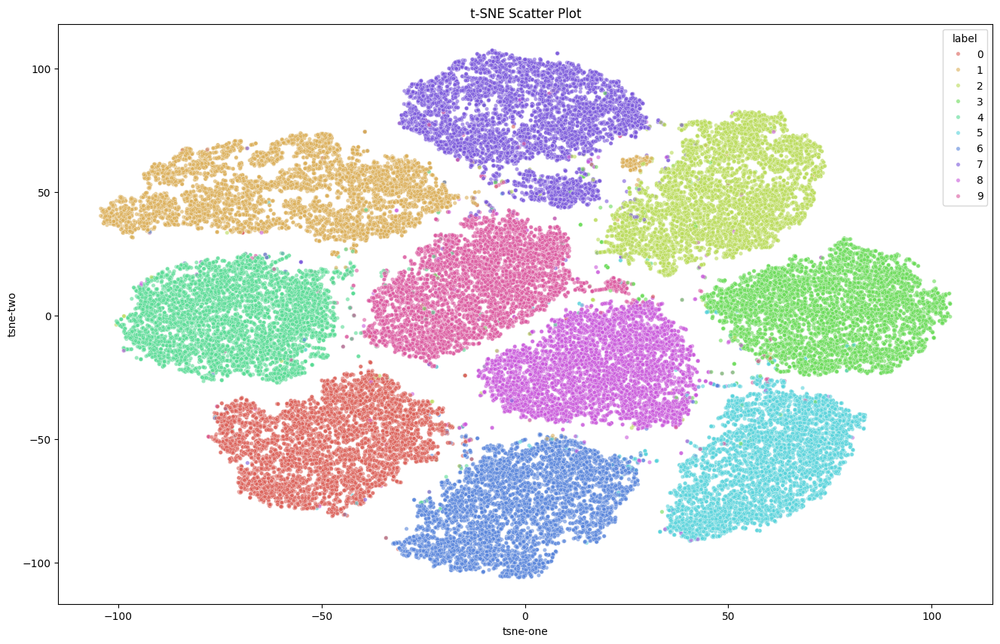

Execution time: 413.51 seconds


In [8]:
start_time = time.time()

tsne_result = TSNE(random_state=42).fit_transform(features)

df_tsne = pd.DataFrame({
    'tsne-one': tsne_result[:, 0],
    'tsne-two': tsne_result[:, 1],
    'label': labels
})

plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='tsne-one', y='tsne-two',
    hue='label',
    palette=sns.color_palette('hls', 10),
    data=df_tsne,
    legend='full',
    alpha=0.6,
    s=15
)
plt.title('t-SNE Scatter Plot')
plt.show()

end_time = time.time()  
print(f"Execution time: {end_time - start_time:.2f} seconds")

In [9]:
df['x'] = tsne_result[:, 0]
df['y'] = tsne_result[:, 1]
df.head()

,pixels,label,features,x,y
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 3.8248394, 0.0, 0.0, 0.53887403, 0.0, 0....",63.822712,-52.471718
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[0.120511204, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0....",-47.542915,-37.904472
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 0.0, 5.729928, 1.68233, 0...",-49.599205,0.381803
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,"[4.4412627, 0.0, 0.0, 0.0, 0.0, 2.3062212, 2.4...",-87.219345,54.149433
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9,"[0.0, 1.1709722, 0.0, 0.0, 0.0, 4.9130316, 0.0...",-17.735113,15.209163


- #### HDBSCAN으로 클러스터링

c:\Users\PC\Desktop\Dim_Reduction_Project\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\PC\Desktop\Dim_Reduction_Project\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


HDBSCAN ARI (with label-based init): 0.9425


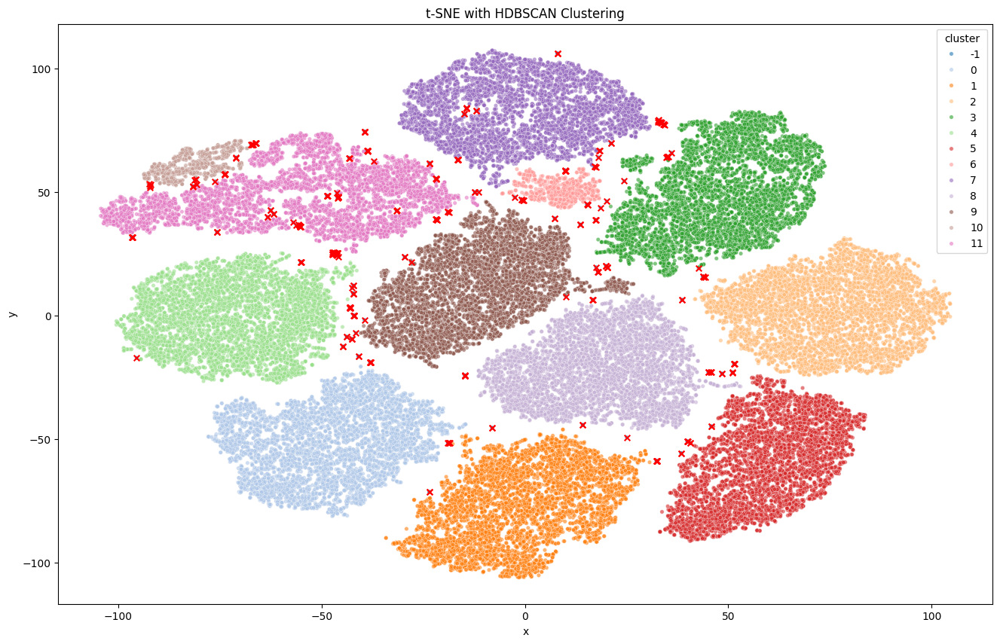

In [10]:
# t-SNE 결과에 HDBSCAN 적용
hdbscan_cluster = hdbscan.HDBSCAN(
    min_samples=10,
    min_cluster_size=500
)

df['cluster'] = hdbscan_cluster.fit_predict(tsne_result)

# 시각화
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='cluster',
    palette='tab20',
    data=df,
    legend='full',
    alpha=0.6,
    s=15
)

# 노이즈 표시
plt.scatter(
    df.loc[df['cluster'] == -1, 'x'],
    df.loc[df['cluster'] == -1, 'y'],
    color='red',
    marker='x',
    s=30
)

# 평가 지표 계산
# Adjusted Rand Index (ARI)
ari_kmeans = adjusted_rand_score(df['label'], df['cluster'])
print(f"HDBSCAN ARI (with label-based init): {ari_kmeans:.4f}")

plt.title('t-SNE with HDBSCAN Clustering')
plt.show()

In [11]:
df.head()

,pixels,label,features,x,y,cluster
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 3.8248394, 0.0, 0.0, 0.53887403, 0.0, 0....",63.822712,-52.471718,5
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[0.120511204, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0....",-47.542915,-37.904472,0
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 0.0, 5.729928, 1.68233, 0...",-49.599205,0.381803,4
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,"[4.4412627, 0.0, 0.0, 0.0, 0.0, 2.3062212, 2.4...",-87.219345,54.149433,10
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9,"[0.0, 1.1709722, 0.0, 0.0, 0.0, 4.9130316, 0.0...",-17.735113,15.209163,9


In [12]:
df['cluster'].value_counts()

cluster
 3     7166
 2     7084
 1     6930
 9     6925
 0     6918
 8     6809
 4     6791
 11    6790
 7     6384
 5     6221
 6      870
 10     842
-1      270
Name: count, dtype: int64

- #### 클러스터에서 제일 많은 분포의 라벨로 클러스터 이름 변경 (단, 클러스터가 -1인 경우 즉 noise인 경우는 제외)

cluster
 1    7632
 7    7254
 2    7166
 3    7084
 6    6930
 9    6925
 0    6918
 8    6809
 4    6791
 5    6221
-1     270
Name: count, dtype: int64


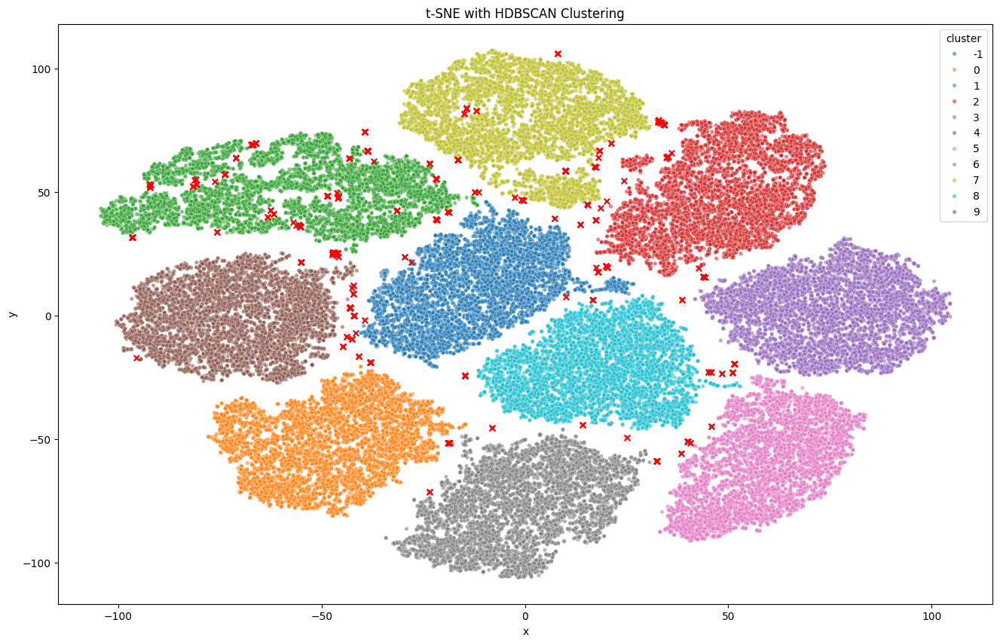

In [13]:
# 클러스터별로 가장 많은 라벨로 클러스터 ID를 변경
def update_cluster_labels(row, cluster_label_map):
    cluster_id = row['cluster']
    if cluster_id == -1:  # 노이즈 클러스터는 그대로 유지
        return -1
    return cluster_label_map.get(cluster_id, cluster_id)

# 클러스터별로 라벨 분포 계산
cluster_label_map = (
    df[df['cluster'] != -1]  # 노이즈 제외
    .groupby('cluster')['label']
    .agg(lambda x: x.value_counts().idxmax())  # 가장 많이 등장한 라벨
    .to_dict()
)

# df['cluster'] 업데이트
df['cluster'] = df.apply(update_cluster_labels, axis=1, cluster_label_map=cluster_label_map)

# 결과 확인
print(df['cluster'].value_counts())

# 시각화
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='cluster',
    palette='tab10',
    data=df,
    legend='full',
    alpha=0.6,
    s=15
)

# 노이즈 표시
plt.scatter(
    df.loc[df['cluster'] == -1, 'x'],
    df.loc[df['cluster'] == -1, 'y'],
    color='red',
    marker='x',
    s=30
)

plt.title('t-SNE with HDBSCAN Clustering')
plt.show()

- #### 클러스터가 -1인 경우는 가장 가까운 클러스터로 편입

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_16204\2789762409.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  noise_points['cluster'] = noise_points.apply(assign_nearest_cluster, axis=1, centroids=centroids)


cluster
1    7718
7    7297
2    7195
3    7088
9    6957
6    6934
0    6928
8    6828
4    6820
5    6235
Name: count, dtype: int64


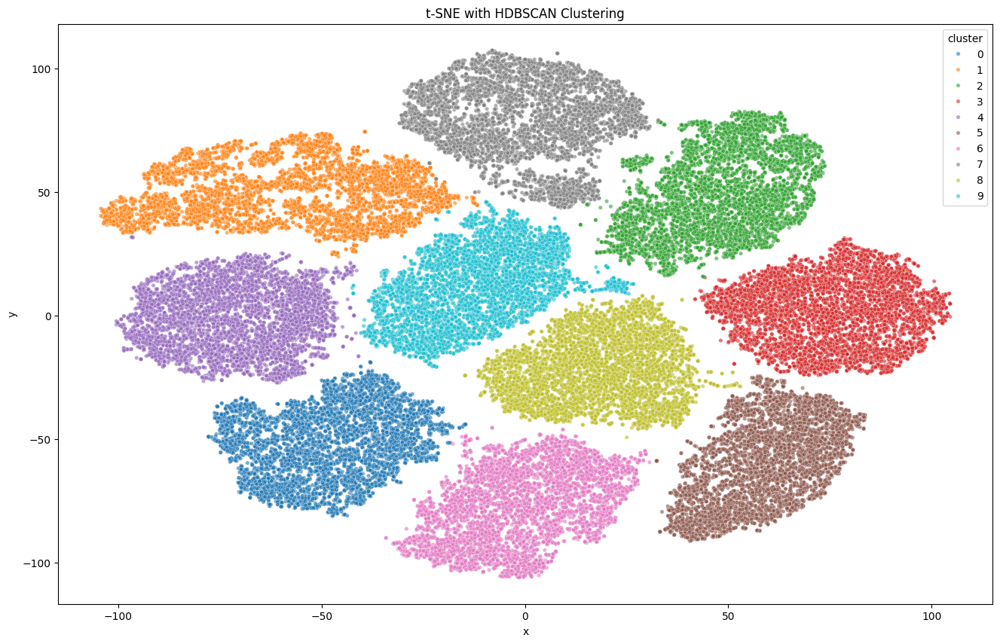

In [14]:
# t-SNE 결과로부터 x, y 좌표를 사용하여 거리 계산
noise_points = df[df['cluster'] == -1]  # 노이즈 데이터
cluster_points = df[df['cluster'] != -1]  # 클러스터 데이터

# 클러스터별 중심 좌표 계산
cluster_centroids = (
    cluster_points.groupby('cluster')[['x', 'y']]
    .mean()
    .to_dict(orient='index')
)

# 노이즈 데이터를 클러스터 중심과 비교하여 가장 가까운 클러스터에 편입
def assign_nearest_cluster(row, centroids):
    distances = {cluster: euclidean_distances([[row['x'], row['y']]], [coord]).item()
                 for cluster, coord in centroids.items()}
    return min(distances, key=distances.get)

# -1 클러스터 데이터에 대해 최근접 클러스터 할당
if not noise_points.empty:
    centroids = {k: [v['x'], v['y']] for k, v in cluster_centroids.items()}
    noise_points['cluster'] = noise_points.apply(assign_nearest_cluster, axis=1, centroids=centroids)
    
    # 기존 데이터에 업데이트
    df.update(noise_points)

# 결과 확인
print(df['cluster'].value_counts())

# 시각화
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='cluster',
    palette='tab10',
    data=df,
    legend='full',
    alpha=0.6,
    s=15
)

# 노이즈 표시
plt.scatter(
    df.loc[df['cluster'] == -1, 'x'],
    df.loc[df['cluster'] == -1, 'y'],
    color='red',
    marker='x',
    s=30
)

plt.title('t-SNE with HDBSCAN Clustering')
plt.show()

- #### label과 cluster 값이 다를 경우 outlier 열에 -1 값 부여

Cluster Final Mapping (After Adjustment):
   label  cluster  outlier
0      5        5        5
1      0        0        0
2      4        4        4
3      1        1        1
4      9        9        9


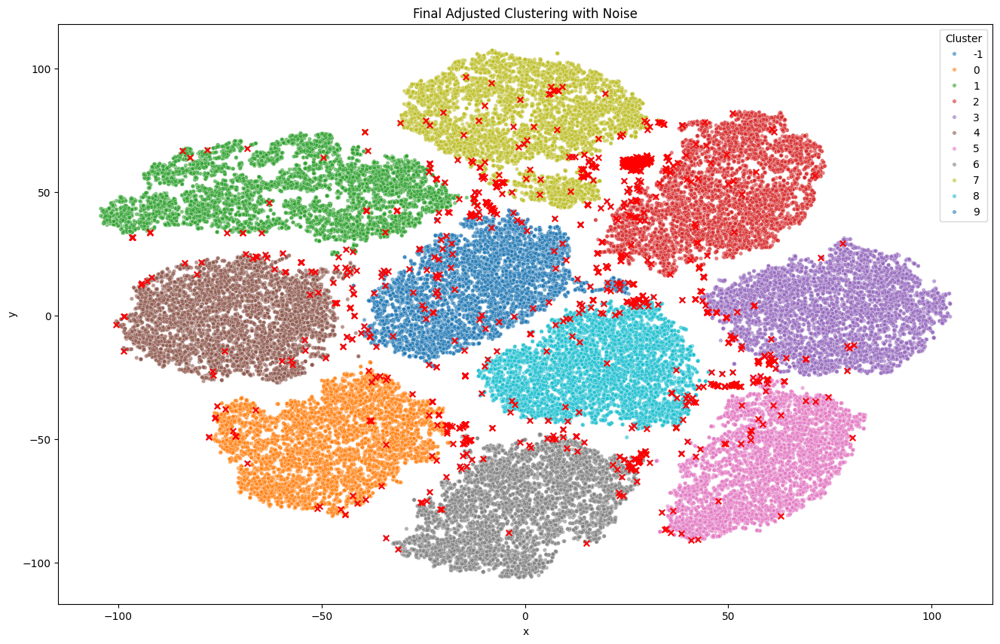

In [15]:
# cluster와 label이 같지 않은 경우 cluster를 -1로 변경
df['outlier'] = df.apply(
    lambda row: row['cluster'] if row['cluster'] == row['label'] else -1, axis=1
)

# 결과 확인
print("Cluster Final Mapping (After Adjustment):")
print(df[['label', 'cluster', 'outlier']].head())

# 조정된 클러스터 시각화
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='outlier',
    palette='tab10',
    data=df,
    legend='full',
    alpha=0.6,
    s=15
)

# 노이즈 표시
plt.scatter(
    df.loc[df['outlier'] == -1, 'x'],
    df.loc[df['outlier'] == -1, 'y'],
    color='red',
    marker='x',
    s=30
)

plt.title('Final Adjusted Clustering with Noise')
plt.legend(loc='upper right', title='Cluster')
plt.show()

- #### outlier 개수

In [16]:
# cluster_final의 각 값의 개수 계산
cluster_final_counts = df['outlier'].value_counts()

# 결과 출력
print("Cluster Final Counts:")
print(cluster_final_counts)

Cluster Final Counts:
outlier
 1    7680
 7    7188
 3    7027
 2    6946
 0    6870
 6    6842
 9    6826
 4    6759
 8    6707
 5    6191
-1     964
Name: count, dtype: int64


In [20]:
# Cluster 열별로 outlier 열이 -1인 개수를 구하기
cluster_outlier_counts = df[df['outlier'] == -1].groupby('cluster')['outlier'].count()

# 결과를 데이터프레임으로 변환
cluster_outlier_counts_df = cluster_outlier_counts.reset_index()
cluster_outlier_counts_df.columns = ['cluster', 'Outlier_Count']
cluster_outlier_counts_df.to_csv("../data/clustering_result/tsne_noise_counts.csv", index=False)

In [21]:
def encode_pixels_to_base64(image):
    """이미지를 Base64 형식으로 변환"""
    buffer = BytesIO()
    plt.imsave(
        buffer, 
        (image.reshape(28, 28) * 255).astype("uint8"), 
        cmap="gray", 
        format="png"
    )                   # 이미지를 28 X 28 크기로 저장하고, 값 범위를 0~255로 변환해 PNG 형식으로 저장
    
    buffer.seek(0)
    img_str = base64.b64encode(buffer.read()).decode('utf-8') # Base64로 바이트 데이터로 인코딩 후 UTF-8 문자열로 변환
    return img_str

df['image'] = df['pixels'].apply(lambda x: encode_pixels_to_base64(x))

data_to_save = df[['x', 'y', 'cluster', 'outlier', 'image', 'label']]

output_dir = '../data/clustering_result'
os.makedirs(output_dir, exist_ok=True)
json_file_path = os.path.join(output_dir, 'tsne_clustering.json')

data_to_save.to_json(json_file_path, orient='records', indent=4)
print(f"Data saved to {json_file_path}")

Data saved to ../data/clustering_result\tsne_clustering.json


In [22]:
df.head()

,pixels,label,features,x,y,cluster,outlier,image
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 3.8248394, 0.0, 0.0, 0.53887403, 0.0, 0....",63.822712,-52.471718,5,5,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[0.120511204, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0....",-47.542915,-37.904472,0,0,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 0.0, 5.729928, 1.68233, 0...",-49.599205,0.381803,4,4,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,"[4.4412627, 0.0, 0.0, 0.0, 0.0, 2.3062212, 2.4...",-87.219345,54.149433,1,1,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9,"[0.0, 1.1709722, 0.0, 0.0, 0.0, 4.9130316, 0.0...",-17.735113,15.209163,9,9,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...


- #### 클러스터 영역 설정

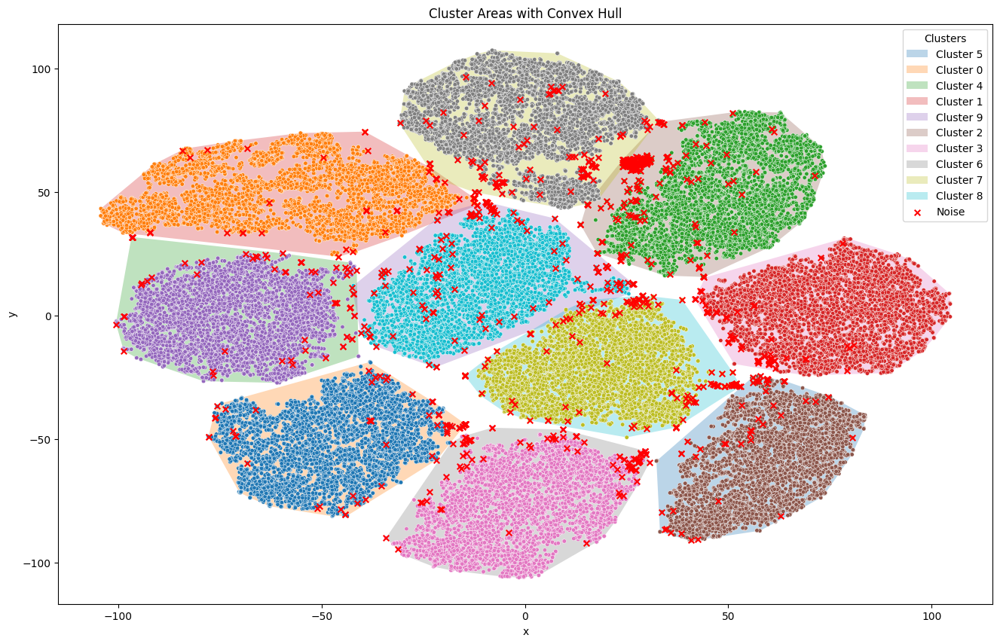

In [23]:
# 필터링된 데이터에서 클러스터 ID 확인
clusters = df['cluster'].unique()

# Convex Hull 기반 영역화
plt.figure(figsize=(16, 10))

for cluster in clusters:
    cluster_points = df[df['cluster'] == cluster][['x', 'y']].values
    
    # Convex Hull 계산 (점이 충분한 경우만)
    if len(cluster_points) >= 3:
        hull = ConvexHull(cluster_points)
        hull_points = cluster_points[hull.vertices]
        
        # 영역(다각형) 시각화
        plt.fill(hull_points[:, 0], hull_points[:, 1], alpha=0.3, label=f'Cluster {cluster}')
    
# 데이터 점 시각화
sns.scatterplot(
    x='x', y='y',
    hue='cluster',
    palette='tab10',
    data=df,
    legend=None,
    s=15
)

# 노이즈 표시
plt.scatter(
    df.loc[df['outlier'] == -1, 'x'],
    df.loc[df['outlier'] == -1, 'y'],
    color='red',
    marker='x',
    s=30,
    label='Noise'
)

plt.title('Cluster Areas with Convex Hull')
plt.legend(loc='upper right', title='Clusters')
plt.show()

In [24]:
# 클러스터 경계 저장
cluster_boundaries = []

for cluster in clusters:
    cluster_points = df[df['cluster'] == cluster][['x', 'y']].values
    
    if len(cluster_points) >= 3:
        hull = ConvexHull(cluster_points)
        boundary_points = cluster_points[hull.vertices]
        
        cluster_boundaries.append({
            'cluster': int(cluster),
            'boundary': boundary_points.tolist()
        })

# JSON 파일로 저장
output_dir = '../data/clustering_result'
os.makedirs(output_dir, exist_ok=True)
json_file_path = os.path.join(output_dir, 'tsne_cluster_boundaries.json')

with open(json_file_path, 'w') as f:
    json.dump(cluster_boundaries, f, indent=4)

print(f"Cluster boundaries saved to {json_file_path}")

Cluster boundaries saved to ../data/clustering_result\tsne_cluster_boundaries.json


In [25]:
# 클러스터별 outlier가 -1인 경우 세기
outlier_counts = df[df['outlier'] == -1].groupby('cluster').size()

# 결과 출력
print(outlier_counts)

cluster
0     58
1     38
2    249
3     61
4     61
5     44
6     92
7    109
8    121
9    131
dtype: int64


- #### 클러스터 중심 이미지로 클러스터별 대표 이미지 설정

In [26]:
# 클러스터 중심 계산 (아웃라이어 제외)
cluster_centers = (
    df[df['outlier'] != -1]
    .groupby('cluster')[['x', 'y']]
    .mean()
    .reset_index()
)

# 각 클러스터에서 중심과 가장 가까운 점 찾기 (아웃라이어 제외)
representative_images = []

for _, center in cluster_centers.iterrows():
    cluster = center['cluster']
    center_coords = np.array([center['x'], center['y']])
    
    # 해당 클러스터 데이터 가져오기 (아웃라이어 제외)
    cluster_data = df[(df['cluster'] == cluster) & (df['outlier'] != -1)]
    
    if not cluster_data.empty:
        # 거리 계산
        distances = np.linalg.norm(cluster_data[['x', 'y']].values - center_coords, axis=1)
        
        # 가장 가까운 점의 인덱스
        closest_point_index = distances.argmin()
        representative_images.append(cluster_data.iloc[closest_point_index])

# 대표 이미지 데이터프레임 생성
representative_images_df = pd.DataFrame(representative_images)

# 인덱스 리셋
representative_images_df.reset_index(drop=True, inplace=True)

representative_images_df

,pixels,label,features,x,y,cluster,outlier,image
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[0.0, 5.11375, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...",-47.666092,-51.227135,0,0,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,"[2.3758712, 0.0, 0.0, 0.0, 0.017165378, 1.7644...",-59.848228,50.136986,1,1,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",2,"[1.7923843, 0.96857065, 0.0, 0.0, 1.6307857, 1...",48.093449,48.672092,2,2,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3,"[0.0, 3.2250347, 0.0, 0.0, 2.879716, 0.0, 0.0,...",75.298088,1.479175,3,3,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 0.0, 5.9833074, 1.4575579...",-71.344368,-1.362938,4,4,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 4.214637, 0.0, 0.0, 2.7631943, 0.0, 0.0,...",58.798206,-59.778458,5,5,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 3.9969854, 2.7256212, 0.0...",-1.377270,-76.959854,6,6,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
7,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",7,"[4.2479033, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7308662...",1.374328,78.896240,7,7,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
8,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",8,"[0.0, 4.287175, 0.0, 0.0, 3.3880637, 0.0, 1.99...",18.316532,-22.175472,8,8,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
9,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9,"[0.0, 1.7699915, 0.0, 0.0, 0.0, 1.9320766, 0.0...",-12.395703,11.701813,9,9,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...


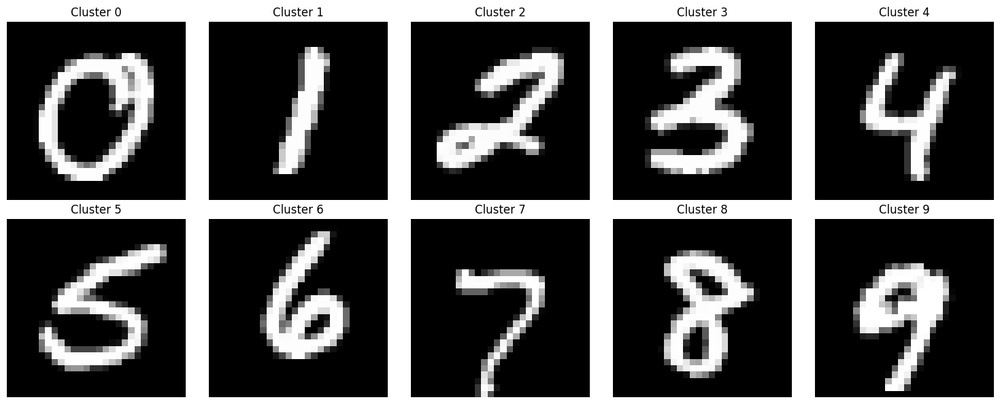

In [27]:
# 대표 이미지 시각화
def visualize_representative_images(representative_images_df, image_size=(28, 28), n_cols=5):
    n_images = len(representative_images_df)
    n_rows = (n_images + n_cols - 1) // n_cols  # 필요한 행 수 계산

    plt.figure(figsize=(n_cols * 3, n_rows * 3))

    for i, (_, row) in enumerate(representative_images_df.iterrows()):
        plt.subplot(n_rows, n_cols, i + 1)
        image = np.array(row['pixels']).reshape(image_size)  # 이미지를 2D 배열로 변환
        plt.imshow(image, cmap='gray')
        plt.title(f"Cluster {row['cluster']}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 대표 이미지 시각화 호출
visualize_representative_images(representative_images_df)


In [28]:
# 필요한 열만 선택
representative_images_to_save = representative_images_df[['cluster', 'x', 'y', 'image']]

# JSON 파일 저장
output_dir = '../data/representative_value'
os.makedirs(output_dir, exist_ok=True)
json_file_path = os.path.join(output_dir, 'tsne_representative_value.json')

representative_images_to_save.to_json(json_file_path, orient='records', indent=4)
print(f"Data saved to {json_file_path}")


Data saved to ../data/representative_value\tsne_representative_value.json


- #### 대표 이미지와 클러스터 간의 코사인 유사도 계산

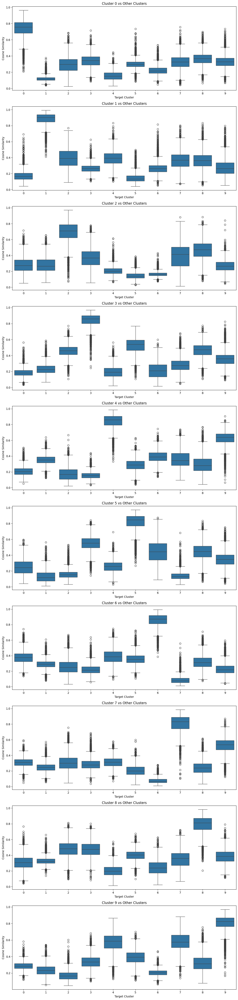

In [29]:
# 코사인 유사도 계산 함수
def calculate_cosine_similarity(features1, features2):
    return cosine_similarity([features1], features2)[0]

# 클러스터 대표 features 추출
representative_features = {
    row['cluster']: np.array(row['features']) for _, row in representative_images_df.iterrows()
}

# 유사도 결과 저장
similarity_data = []

# 각 대표 features와 다른 클러스터의 features 간 유사도 계산
for rep_cluster, rep_feature in representative_features.items():
    for cluster, group in df.groupby('cluster'):
        # 대표 이미지의 좌표 (x, y) 가져오기
        rep_image_coords = representative_images_df[
            representative_images_df['cluster'] == rep_cluster
        ][['x', 'y']].iloc[0].values
        
        # 대표 이미지 자신은 제외
        group = group[(group['x'] != rep_image_coords[0]) | (group['y'] != rep_image_coords[1])]

        if not group.empty:
            # 코사인 유사도 계산
            similarities = calculate_cosine_similarity(rep_feature, np.vstack(group['features']))

            x_coords = group['x'].values
            y_coords = group['y'].values
            pixel_values = group['pixels'].values

            similarity_data.extend([
                {
                    'rep_cluster': rep_cluster, 
                    'target_cluster': cluster, 
                    'similarity': sim,
                    'x': x_coords[i],
                    'y': y_coords[i],
                    'pixel': pixel_values[i]
                }
                for i, sim in enumerate(similarities)
            ])

# 유사도 데이터를 데이터프레임으로 변환
similarity_df = pd.DataFrame(similarity_data)

# 서브플롯 설정
n_clusters = len(representative_features)
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 5 * n_clusters), sharex=False)

# 각 클러스터에 대해 하나의 box plot을 그리기
for i, (rep_cluster, ax) in enumerate(zip(representative_features.keys(), axes)):
    sns.boxplot(
        x='target_cluster',
        y='similarity',
        data=similarity_df[similarity_df['rep_cluster'] == rep_cluster],
        ax=ax
    )
    ax.set_title(f'Cluster {rep_cluster} vs Other Clusters')
    ax.set_xlabel('Target Cluster')
    ax.set_ylabel('Cosine Similarity')

plt.tight_layout()
plt.show()


- #### Box Plot 결과 저장

In [30]:
box_plot_data = []

# rep_cluster 별로 그룹화
for rep_cluster, rep_group in similarity_df.groupby('rep_cluster'):
    # target_cluster 별로 그룹화
    for target_cluster, target_group in rep_group.groupby('target_cluster'):
        similarities = target_group['similarity'].values  # 유사도 값 추출
        
        if len(similarities) > 0:
            # 주요 값 계산
            q1 = np.percentile(similarities, 25)  # 1분위수
            median = np.percentile(similarities, 50)  # 중앙값
            q3 = np.percentile(similarities, 75)  # 3분위수
            iqr = q3 - q1  # IQR
            lower_whisker = max(similarities[similarities >= q1 - 1.5 * iqr].min(), similarities.min())  # 하단 수염
            upper_whisker = min(similarities[similarities <= q3 + 1.5 * iqr].max(), similarities.max())  # 상단 수염
            
            # IQR 범위 내 데이터 개수
            inlier_count = ((similarities >= q1) & (similarities <= q3)).sum()
            
            # IQR 범위를 벗어난 이상치
            outliers = similarities[(similarities < lower_whisker) | (similarities > upper_whisker)]
            
            # 결과 저장
            box_plot_data.append({
                'rep_cluster': rep_cluster,
                'target_cluster': target_cluster,
                'q1': q1,
                'median': median,
                'q3': q3,
                'iqr': iqr,
                'lower_whisker': lower_whisker,
                'upper_whisker': upper_whisker,
                'inlier_count': inlier_count,           # IQR 범위 내 데이터 개수
                'outliers': outliers.tolist(),          # 이상치를 리스트로 저장
                'total_count': len(similarities)        # 전체 데이터 개수
            })

# 결과를 데이터프레임으로 변환
box_plot_df = pd.DataFrame(box_plot_data)
box_plot_df.head()

,rep_cluster,target_cluster,q1,median,q3,iqr,lower_whisker,upper_whisker,inlier_count,outliers,total_count
0,0,0,0.681672,0.755639,0.813344,0.131671,0.484370,0.962728,3463,"[0.45211371779441833, 0.47481387853622437, 0.2...",6927
1,0,1,0.101690,0.116422,0.134099,0.032408,0.053148,0.182647,3858,"[0.1854976862668991, 0.051393214613199234, 0.2...",7718
2,0,2,0.223377,0.296699,0.359418,0.136042,0.024487,0.561139,3597,"[0.6460670828819275, 0.6786910891532898, 0.582...",7195
3,0,3,0.289574,0.343615,0.391414,0.101840,0.137279,0.540406,3544,"[0.12169380486011505, 0.5574996471405029, 0.54...",7088
4,0,4,0.112799,0.151951,0.191924,0.079125,0.029548,0.309703,3410,"[0.31121063232421875, 0.32803890109062195, 0.3...",6820


In [31]:
# CSV 파일로 저장
file_path = "../data/similarity_results/tsne_box_plot_data.csv"
box_plot_df.to_csv(file_path, index=False)


In [32]:
similarity_df

,rep_cluster,target_cluster,similarity,x,y,pixel
0,0,0,0.753875,-47.542915,-37.904472,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,0,0,0.760375,-52.410667,-33.745262,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,0,0,0.714360,-24.902136,-44.235775,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,0,0,0.707081,-24.676483,-37.892105,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,0,0,0.880950,-46.570919,-51.472893,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...
699985,9,9,0.843644,10.909692,26.086647,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
699986,9,9,0.818728,-34.992161,-2.285320,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
699987,9,9,0.914014,-29.486448,17.433279,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
699988,9,9,0.857566,7.170994,23.152115,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [33]:
# outlier가 -1인 데이터 필터링
outlier_data = df[df['outlier'] == -1]

# 결과 저장 리스트
sorted_cosine_results = []

# 각 outlier 데이터에 대해 similarity_df에서 매칭
for _, row in outlier_data.iterrows():
    # x, y 값을 기준으로 similarity_df에서 유사한 행 찾기
    matched_row = similarity_df[
        (similarity_df['x'] == row['x']) & (similarity_df['y'] == row['y'])
    ]
    
    # 일치하는 데이터가 있는 경우
    if not matched_row.empty:
        similarity = matched_row['similarity'].values[0]  # similarity 값 추출
        base64_image = encode_pixels_to_base64(row['pixels'])

        sorted_cosine_results.append({
            'cluster': row['cluster'],
            'label': row['label'],
            'similarity': similarity,
            'x': row['x'],
            'y': row['y'],
            'image': base64_image
        })

# 결과를 데이터프레임으로 변환
sorted_cosine_df = pd.DataFrame(sorted_cosine_results)
sorted_cosine_df

,cluster,label,similarity,x,y,image
0,2,1,0.082886,26.620789,60.543446,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
1,2,1,0.195535,27.974506,61.027325,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
2,8,9,0.526458,39.505436,-36.224258,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
3,3,5,0.171877,59.940567,-18.442022,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
4,9,7,0.267537,-21.688057,10.015953,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
...,...,...,...,...,...,...
959,7,9,0.437688,-0.236510,69.511757,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
960,7,2,0.173019,16.756268,54.868362,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
961,6,5,0.151032,-1.186015,-51.158627,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
962,7,3,0.311543,14.219593,59.126400,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...


In [34]:
# CSV 파일로 저장
file_path = "../data/similarity_results/tsne_cosine_similarity.csv"
sorted_cosine_df.to_csv(file_path, index=False)

- #### UMAP은 KMeans를 써야 경계선 생성에 문제가 없음 (HDBSCAN을 쓰면 다른 클러스터가 멀리 떨어지는 경우가 발생)

In [35]:
data_list = []

for images, labels in combined_loader:
    for image, label in zip(images, labels):
        image_array = image.numpy().flatten()
        data_list.append({'pixels': image_array, 'label': label.item()})

df = pd.DataFrame(data_list)
df.head()

,pixels,label
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9


In [36]:
model = torch.load('../models/cnn_model.pth')
model.eval()

feature_extractor = FeatureExtractor(model)
feature_extractor.eval()

features, labels = extract_features(combined_loader, feature_extractor)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_16204\1696138789.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('../models/cnn_model.pth')


In [37]:
df['features'] = [list(feature) for feature in features]
df.head()

,pixels,label,features
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 3.8248394, 0.0, 0.0, 0.53887403, 0.0, 0...."
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[0.120511204, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...."
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 0.0, 5.729928, 1.68233, 0..."
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,"[4.4412627, 0.0, 0.0, 0.0, 0.0, 2.3062212, 2.4..."
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9,"[0.0, 1.1709722, 0.0, 0.0, 0.0, 4.9130316, 0.0..."


c:\Users\PC\Desktop\Dim_Reduction_Project\venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\PC\Desktop\Dim_Reduction_Project\venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


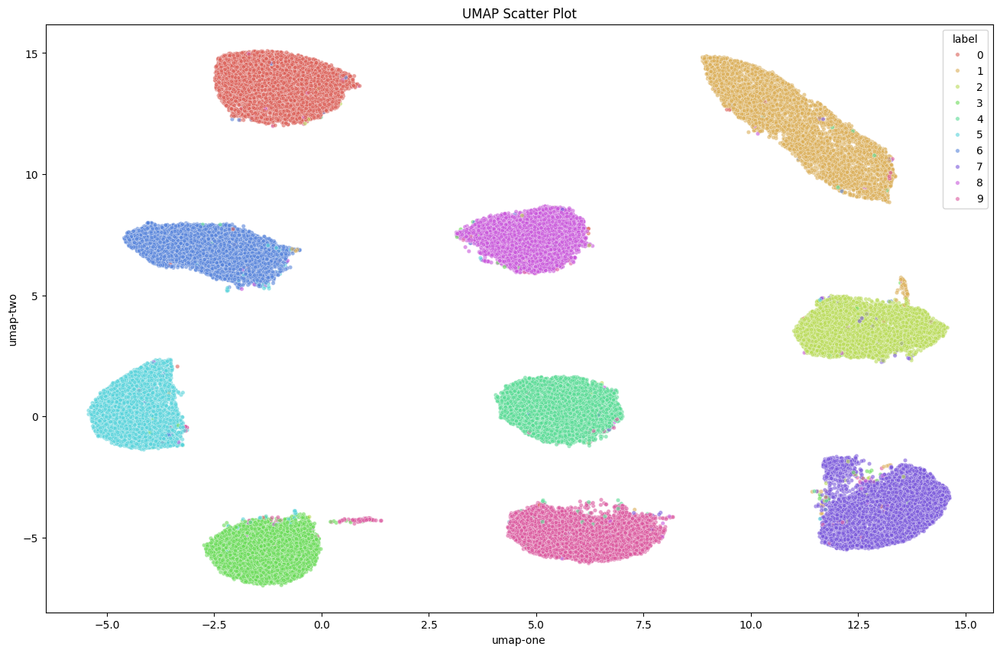

Execution time: 84.27 seconds


In [38]:
start_time = time.time()

umap_result = umap.UMAP(random_state=42).fit_transform(features)

df_umap = pd.DataFrame({
    'umap-one': umap_result[:, 0],
    'umap-two': umap_result[:, 1],
    'label': labels
})

plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='umap-one', y='umap-two',
    hue='label',
    palette=sns.color_palette('hls', 10),
    data=df_umap,
    legend='full',
    alpha=0.6,
    s=15
)
plt.title('UMAP Scatter Plot')
plt.show()

end_time = time.time()  
print(f"Execution time: {end_time - start_time:.2f} seconds")

In [39]:
df['x'] = umap_result[:, 0]
df['y'] = umap_result[:, 1]
df.head()

,pixels,label,features,x,y
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 3.8248394, 0.0, 0.0, 0.53887403, 0.0, 0....",-4.219988,0.001000
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[0.120511204, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0....",-0.730857,13.127511
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 0.0, 5.729928, 1.68233, 0...",4.922749,-0.666081
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,"[4.4412627, 0.0, 0.0, 0.0, 0.0, 2.3062212, 2.4...",10.031152,14.035340
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9,"[0.0, 1.1709722, 0.0, 0.0, 0.0, 4.9130316, 0.0...",6.297180,-4.691052


KMeans ARI (with label-based init): 0.9681


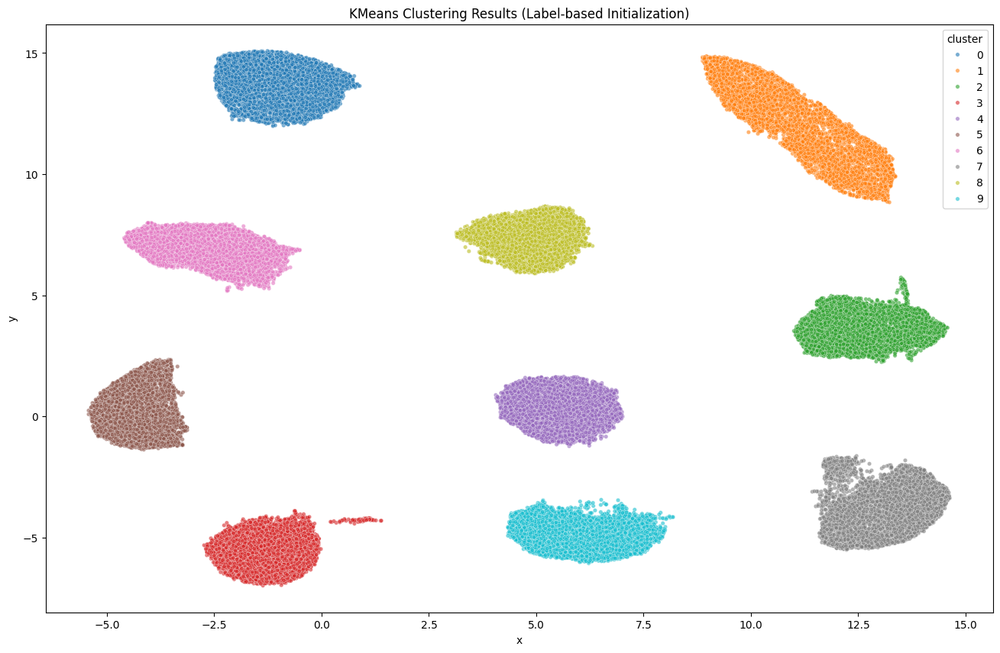

In [40]:
# 각 레이블의 중심 계산
initial_centers = df.groupby('label')[['x', 'y']].mean().to_numpy()

# KMeans 클러스터링 실행 (초기 중심 지정)
kmeans_clusterer = KMeans(n_clusters=10, init=initial_centers, n_init=1, random_state=42)
df['cluster'] = kmeans_clusterer.fit_predict(df[['x', 'y']])

# KMeans 결과 시각화
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='cluster',
    palette='tab10',
    data=df,
    legend='full',
    alpha=0.6,
    s=15
)

# 평가 지표 계산
# Adjusted Rand Index (ARI)
ari_kmeans = adjusted_rand_score(df['label'], df['cluster'])
print(f"KMeans ARI (with label-based init): {ari_kmeans:.4f}")

plt.title("KMeans Clustering Results (Label-based Initialization)")
plt.show()

Cluster Final Mapping (After Adjustment):
   label  cluster  outlier
0      5        5        5
1      0        0        0
2      4        4        4
3      1        1        1
4      9        9        9


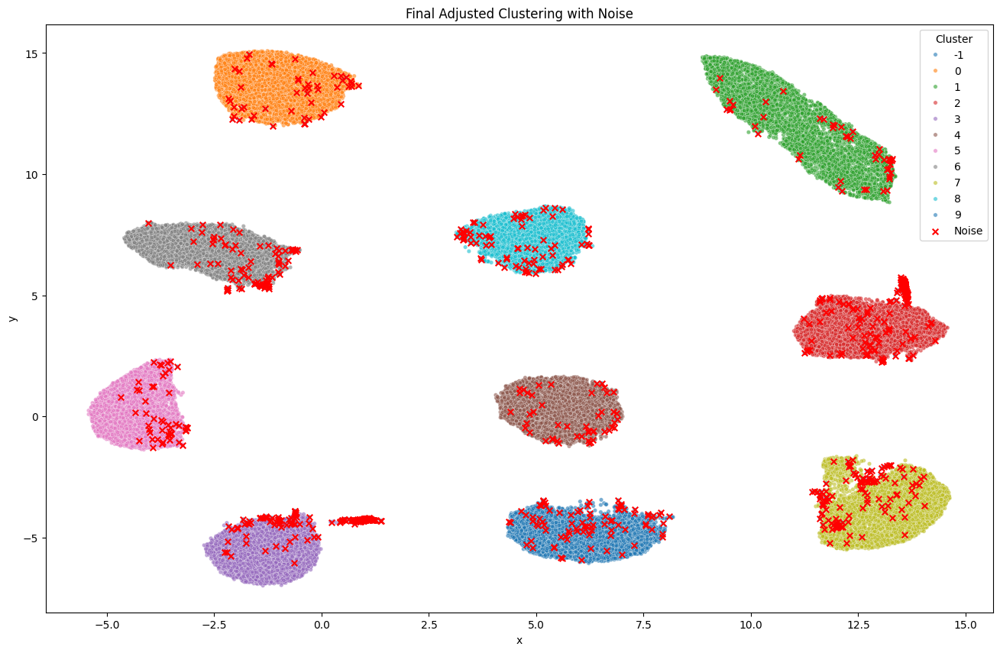

In [41]:
# cluster와 label이 같지 않은 경우 cluster를 -1로 변경
df['outlier'] = df.apply(
    lambda row: row['cluster'] if row['cluster'] == row['label'] else -1, axis=1
)

# 결과 확인
print("Cluster Final Mapping (After Adjustment):")
print(df[['label', 'cluster', 'outlier']].head())

# 조정된 클러스터 시각화
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x='x', y='y',
    hue='outlier',
    palette='tab10',
    data=df,
    legend='full',
    alpha=0.6,
    s=15
)

# 노이즈 표시
plt.scatter(
    df.loc[df['outlier'] == -1, 'x'],
    df.loc[df['outlier'] == -1, 'y'],
    color='red',
    marker='x',
    s=30,
    label='Noise'
)

plt.title('Final Adjusted Clustering with Noise')
plt.legend(loc='upper right', title='Cluster')
plt.show()

In [42]:
# cluster_final의 각 값의 개수 계산
cluster_final_counts = df['outlier'].value_counts()

# 결과 출력
print("Cluster Final Counts:")
print(cluster_final_counts)

Cluster Final Counts:
outlier
 1    7694
 7    7224
 3    7051
 2    6941
 0    6868
 6    6842
 4    6752
 8    6724
 9    6680
 5    6214
-1    1010
Name: count, dtype: int64


In [43]:
# Cluster 열별로 outlier 열이 -1인 개수를 구하기
cluster_outlier_counts = df[df['outlier'] == -1].groupby('cluster')['outlier'].count()

# 결과를 데이터프레임으로 변환
cluster_outlier_counts_df = cluster_outlier_counts.reset_index()
print(cluster_outlier_counts_df.head())
cluster_outlier_counts_df.columns = ['cluster', 'Outlier_Count']
cluster_outlier_counts_df.to_csv("../data/clustering_result/umap_noise_counts.csv", index=False)

   cluster  outlier
0        0       49
1        1       48
2        2      233
3        3      210
4        4       48


In [44]:
def encode_pixels_to_base64(image):
    """이미지를 Base64 형식으로 변환"""
    buffer = BytesIO()
    plt.imsave(
        buffer, 
        (image.reshape(28, 28) * 255).astype("uint8"), 
        cmap="gray", 
        format="png"
    )                   # 이미지를 28 X 28 크기로 저장하고, 값 범위를 0~255로 변환해 PNG 형식으로 저장
    
    buffer.seek(0)
    img_str = base64.b64encode(buffer.read()).decode('utf-8') # Base64로 바이트 데이터로 인코딩 후 UTF-8 문자열로 변환
    return img_str

df['image'] = df['pixels'].apply(lambda x: encode_pixels_to_base64(x))

data_to_save = df[['x', 'y', 'cluster', 'outlier', 'image', 'label']]

output_dir = '../data/clustering_result'
os.makedirs(output_dir, exist_ok=True)
json_file_path = os.path.join(output_dir, 'umap_clustering.json')

data_to_save.to_json(json_file_path, orient='records', indent=4)
print(f"Data saved to {json_file_path}")

Data saved to ../data/clustering_result\umap_clustering.json


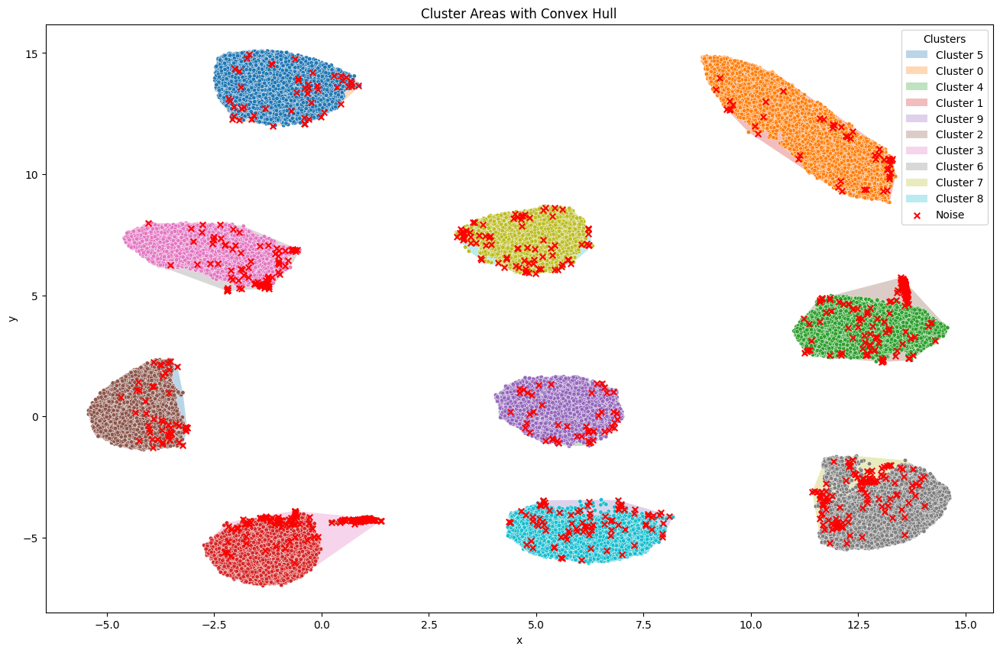

In [45]:
# 필터링된 데이터에서 클러스터 ID 확인
clusters = df['cluster'].unique()

# Convex Hull 기반 영역화
plt.figure(figsize=(16, 10))

for cluster in clusters:
    cluster_points = df[df['cluster'] == cluster][['x', 'y']].values
    
    # Convex Hull 계산 (점이 충분한 경우만)
    if len(cluster_points) >= 3:
        hull = ConvexHull(cluster_points)
        hull_points = cluster_points[hull.vertices]
        
        # 영역(다각형) 시각화
        plt.fill(hull_points[:, 0], hull_points[:, 1], alpha=0.3, label=f'Cluster {cluster}')
    
# 데이터 점 시각화
sns.scatterplot(
    x='x', y='y',
    hue='cluster',
    palette='tab10',
    data=df,
    legend=None,
    s=15
)

# 노이즈 표시
plt.scatter(
    df.loc[df['outlier'] == -1, 'x'],
    df.loc[df['outlier'] == -1, 'y'],
    color='red',
    marker='x',
    s=30,
    label='Noise'
)

plt.title('Cluster Areas with Convex Hull')
plt.legend(loc='upper right', title='Clusters')
plt.show()

In [46]:
cluster_boundaries = []

for cluster in clusters:
    cluster_points = df[df['cluster'] == cluster][['x', 'y']].values
    
    if len(cluster_points) >= 3:
        hull = ConvexHull(cluster_points)
        boundary_points = cluster_points[hull.vertices]
        
        cluster_boundaries.append({
            'cluster': int(cluster),
            'boundary': boundary_points.tolist()
        })

# JSON 파일로 저장
output_dir = '../data/clustering_result'
os.makedirs(output_dir, exist_ok=True)
json_file_path = os.path.join(output_dir, 'umap_cluster_boundaries.json')

with open(json_file_path, 'w') as f:
    json.dump(cluster_boundaries, f, indent=4)

print(f"Cluster boundaries saved to {json_file_path}")

Cluster boundaries saved to ../data/clustering_result\umap_cluster_boundaries.json


In [47]:
# 클러스터 중심 계산 (아웃라이어 제외)
cluster_centers = (
    df[df['outlier'] != -1]
    .groupby('cluster')[['x', 'y']]
    .mean()
    .reset_index()
)

# 각 클러스터에서 중심과 가장 가까운 점 찾기 (아웃라이어 제외)
representative_images = []

for _, center in cluster_centers.iterrows():
    cluster = center['cluster']
    center_coords = np.array([center['x'], center['y']])
    
    # 해당 클러스터 데이터 가져오기 (아웃라이어 제외)
    cluster_data = df[(df['cluster'] == cluster) & (df['outlier'] != -1)]
    
    if not cluster_data.empty:
        # 거리 계산
        distances = np.linalg.norm(cluster_data[['x', 'y']].values - center_coords, axis=1)
        
        # 가장 가까운 점의 인덱스
        closest_point_index = distances.argmin()
        representative_images.append(cluster_data.iloc[closest_point_index])

# 대표 이미지 데이터프레임 생성
representative_images_df = pd.DataFrame(representative_images)

# 인덱스 리셋
representative_images_df.reset_index(drop=True, inplace=True)

representative_images_df

,pixels,label,features,x,y,cluster,outlier,image
0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,"[0.0, 1.2675471, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",-1.006992,13.722481,0,0,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,"[2.4684472, 0.0, 0.0, 0.0, 0.13786322, 2.13561...",11.188866,11.863343,1,1,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",2,"[5.3362346, 0.0, 0.0, 0.0, 6.1881185, 5.766877...",12.638212,3.550219,2,2,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3,"[0.0, 3.127535, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",-1.294334,-5.621452,3,3,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4,"[0.0, 0.0, 0.0, 0.0, 0.0, 3.1905584, 0.5033666...",5.535277,0.345995,4,4,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,"[0.0, 5.301512, 0.0, 0.0, 2.491643, 0.0, 0.0, ...",-4.291017,0.247226,5,5,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
6,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,"[0.0, 0.0, 0.0, 0.0, 3.7867234, 2.4576473, 0.0...",-2.602611,6.890784,6,6,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
7,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",7,"[2.9687955, 0.0, 0.0, 0.0, 0.0, 0.0, 2.9325147...",13.011757,-3.670235,7,7,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
8,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",8,"[0.0, 4.653155, 0.0, 0.0, 3.9720304, 1.6591609...",4.807999,7.375658,8,8,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
9,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",9,"[0.0, 1.0987072, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",6.077932,-4.919784,9,9,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...


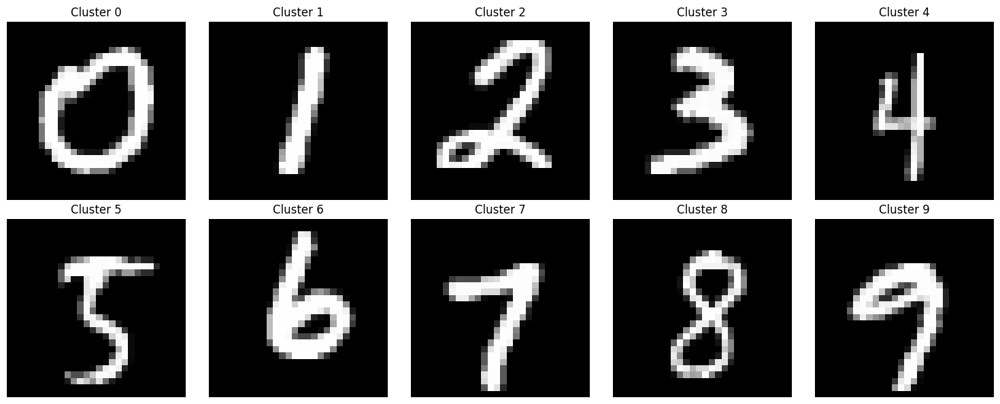

In [48]:
# 대표 이미지 시각화
def visualize_representative_images(representative_images_df, image_size=(28, 28), n_cols=5):
    n_images = len(representative_images_df)
    n_rows = (n_images + n_cols - 1) // n_cols  # 필요한 행 수 계산

    plt.figure(figsize=(n_cols * 3, n_rows * 3))

    for i, (_, row) in enumerate(representative_images_df.iterrows()):
        plt.subplot(n_rows, n_cols, i + 1)
        image = np.array(row['pixels']).reshape(image_size)  # 이미지를 2D 배열로 변환
        plt.imshow(image, cmap='gray')
        plt.title(f"Cluster {row['cluster']}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 대표 이미지 시각화 호출
visualize_representative_images(representative_images_df)

In [49]:
# 필요한 열만 선택
representative_images_to_save = representative_images_df[['cluster', 'x', 'y', 'image']]

# JSON 파일 저장
output_dir = '../data/representative_value'
os.makedirs(output_dir, exist_ok=True)
json_file_path = os.path.join(output_dir, 'umap_representative_value.json')

representative_images_to_save.to_json(json_file_path, orient='records', indent=4)
print(f"Data saved to {json_file_path}")

Data saved to ../data/representative_value\umap_representative_value.json


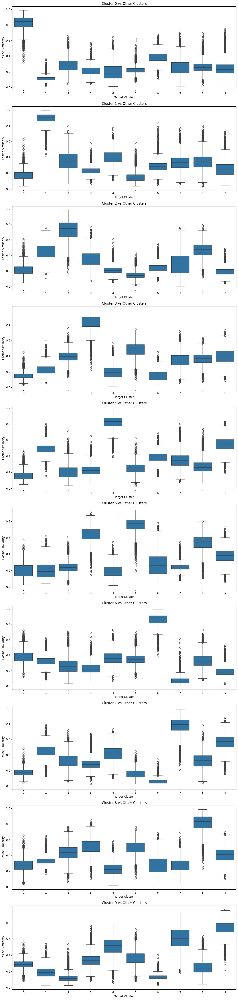

In [50]:
# 코사인 유사도 계산 함수
def calculate_cosine_similarity(features1, features2):
    return cosine_similarity([features1], features2)[0]

# 클러스터 대표 features 추출
representative_features = {
    row['cluster']: np.array(row['features']) for _, row in representative_images_df.iterrows()
}

# 유사도 결과 저장
similarity_data = []

# 각 대표 features와 다른 클러스터의 features 간 유사도 계산
for rep_cluster, rep_feature in representative_features.items():
    for cluster, group in df.groupby('cluster'):
        # 대표 이미지의 좌표 (x, y) 가져오기
        rep_image_coords = representative_images_df[
            representative_images_df['cluster'] == rep_cluster
        ][['x', 'y']].iloc[0].values
        
        # 대표 이미지 자신은 제외
        group = group[(group['x'] != rep_image_coords[0]) | (group['y'] != rep_image_coords[1])]

        if not group.empty:
            # 코사인 유사도 계산
            similarities = calculate_cosine_similarity(rep_feature, np.vstack(group['features']))

            x_coords = group['x'].values
            y_coords = group['y'].values
            pixel_values = group['pixels'].values

            similarity_data.extend([
                {
                    'rep_cluster': rep_cluster, 
                    'target_cluster': cluster, 
                    'similarity': sim,
                    'x': x_coords[i],
                    'y': y_coords[i],
                    'pixel': pixel_values[i]
                }
                for i, sim in enumerate(similarities)
            ])

# 유사도 데이터를 데이터프레임으로 변환
similarity_df = pd.DataFrame(similarity_data)

# 서브플롯 설정
n_clusters = len(representative_features)
fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 5 * n_clusters), sharex=False)

# 각 클러스터에 대해 하나의 box plot을 그리기
for i, (rep_cluster, ax) in enumerate(zip(representative_features.keys(), axes)):
    sns.boxplot(
        x='target_cluster',
        y='similarity',
        data=similarity_df[similarity_df['rep_cluster'] == rep_cluster],
        ax=ax
    )
    ax.set_title(f'Cluster {rep_cluster} vs Other Clusters')
    ax.set_xlabel('Target Cluster')
    ax.set_ylabel('Cosine Similarity')

plt.tight_layout()
plt.show()

In [51]:
box_plot_data = []

# rep_cluster 별로 그룹화
for rep_cluster, rep_group in similarity_df.groupby('rep_cluster'):
    # target_cluster 별로 그룹화
    for target_cluster, target_group in rep_group.groupby('target_cluster'):
        similarities = target_group['similarity'].values  # 유사도 값 추출
        
        if len(similarities) > 0:
            # 주요 값 계산
            q1 = np.percentile(similarities, 25)  # 1분위수
            median = np.percentile(similarities, 50)  # 중앙값
            q3 = np.percentile(similarities, 75)  # 3분위수
            iqr = q3 - q1  # IQR
            lower_whisker = max(similarities[similarities >= q1 - 1.5 * iqr].min(), similarities.min())  # 하단 수염
            upper_whisker = min(similarities[similarities <= q3 + 1.5 * iqr].max(), similarities.max())  # 상단 수염
            
            # IQR 범위 내 데이터 개수
            inlier_count = ((similarities >= q1) & (similarities <= q3)).sum()
            
            # IQR 범위를 벗어난 이상치
            outliers = similarities[(similarities < lower_whisker) | (similarities > upper_whisker)]
            
            # 결과 저장
            box_plot_data.append({
                'rep_cluster': rep_cluster,
                'target_cluster': target_cluster,
                'q1': q1,
                'median': median,
                'q3': q3,
                'iqr': iqr,
                'lower_whisker': lower_whisker,
                'upper_whisker': upper_whisker,
                'inlier_count': inlier_count,           # IQR 범위 내 데이터 개수
                'outliers': outliers.tolist(),          # 이상치를 리스트로 저장
                'total_count': len(similarities)        # 전체 데이터 개수
            })

# 결과를 데이터프레임으로 변환
box_plot_df = pd.DataFrame(box_plot_data)
box_plot_df.head()

,rep_cluster,target_cluster,q1,median,q3,iqr,lower_whisker,upper_whisker,inlier_count,outliers,total_count
0,0,0,0.778391,0.844819,0.891324,0.112932,0.609512,0.987644,3458,"[0.6039741635322571, 0.5901338458061218, 0.579...",6916
1,0,1,0.094249,0.110592,0.127505,0.033257,0.044395,0.177378,3870,"[0.04007592424750328, 0.31009212136268616, 0.2...",7742
2,0,2,0.225869,0.284203,0.337540,0.111672,0.059120,0.504432,3586,"[0.5226176381111145, 0.5188481211662292, 0.514...",7174
3,0,3,0.173162,0.208747,0.247318,0.074155,0.063457,0.358139,3631,"[0.05804351717233658, 0.3601492941379547, 0.41...",7261
4,0,4,0.117766,0.180255,0.268724,0.150958,0.011270,0.494959,3400,"[0.5106167793273926, 0.5393332839012146, 0.508...",6800


In [52]:
# CSV 파일로 저장
file_path = "../data/similarity_results/umap_box_plot_data.csv"
box_plot_df.to_csv(file_path, index=False)

In [53]:
# outlier가 -1인 데이터 필터링
outlier_data = df[df['outlier'] == -1]

# 결과 저장 리스트
sorted_cosine_results = []

# 각 outlier 데이터에 대해 similarity_df에서 매칭
for _, row in outlier_data.iterrows():
    # x, y 값을 기준으로 similarity_df에서 유사한 행 찾기
    matched_row = similarity_df[
        (similarity_df['x'] == row['x']) & (similarity_df['y'] == row['y'])
    ]
    
    # 일치하는 데이터가 있는 경우
    if not matched_row.empty:
        similarity = matched_row['similarity'].values[0]  # similarity 값 추출
        base64_image = encode_pixels_to_base64(row['pixels'])

        sorted_cosine_results.append({
            'cluster': row['cluster'],
            'label': row['label'],
            'similarity': similarity,
            'x': row['x'],
            'y': row['y'],
            'image': base64_image
        })

# 결과를 데이터프레임으로 변환
sorted_cosine_df = pd.DataFrame(sorted_cosine_results)
sorted_cosine_df

,cluster,label,similarity,x,y,image
0,2,1,0.086721,13.576143,5.381317,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
1,3,9,0.237191,0.484612,-4.278633,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
2,2,1,0.206502,13.593959,5.202538,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
3,8,9,0.444059,3.286321,7.591926,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
4,3,5,0.131237,-1.286130,-4.178254,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
...,...,...,...,...,...,...
1005,7,9,0.152235,11.746466,-3.334219,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
1006,6,5,0.240354,-1.052716,6.957532,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
1007,7,2,0.260216,13.555112,-2.485168,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...
1008,7,3,0.188297,12.390464,-2.310792,iVBORw0KGgoAAAANSUhEUgAAABwAAAAcCAYAAAByDd+UAA...


In [54]:
# CSV 파일로 저장
file_path = "../data/similarity_results/umap_cosine_similarity.csv"
sorted_cosine_df.to_csv(file_path, index=False)